In [25]:
import os
import re
import pandas as pd
import pickle as pkl
from os.path import join
import glob
from tqdm.auto import tqdm
import seaborn as sns
import matplotlib.pyplot as plt
# Directory containing results
# results_dir = r"F:\insilico_exps\BigGAN_hyperparam_tune\resnet50_linf8"
results_dir = r"/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/Projects/BigGAN_hyperparam_tune/alexnet"

# Define regex pattern to extract parameters
# pattern = r"Evol_results_BigGAN_(?P<gan_type>INet|EcoSet)(_sigma(?P<sigma>[\d\.]+))?_resnet50_linf8_(?P<layer>\w+)_ch(?P<channel>\d+)_rep(?P<rep>\d+)\.pkl"
pattern = r"Evol_results_(?P<gan_type>BigGAN_INet|BigGAN_EcoSet|DeePSim_fc6_INet|DeePSim_FC6_INet)(_sigma(?P<sigma>[\d\.]+))?_resnet50_linf8_(?P<layer>\w+)_ch(?P<channel>\d+)_rep(?P<rep>\d+)\.pkl"

pkl_files = glob.glob(join(results_dir, "Evol_results_*.pkl"))
# Create empty lists to store parameters
params = []

# Extract parameters from each filename
for pkl_file in tqdm(pkl_files):
    filename = os.path.basename(pkl_file)
    match = re.match(pattern, filename)
    if match:
        with open(pkl_file, 'rb') as f:
            data = pkl.load(f)
        best_img = data["best_imgs"][-1]
        last_gen_score = data['scores'][data['generations']==99]
        mid_gen30_score = data['scores'][data['generations']==30]
        mid_gen50_score = data['scores'][data['generations']==50]
        last_mean_score = last_gen_score.mean()
        mid_gen30_mean_score = mid_gen30_score.mean()
        mid_gen50_mean_score = mid_gen50_score.mean()
        param_dict = match.groupdict()
        param_dict['filename'] = filename
        param_dict['filepath'] = pkl_file
        # Convert numeric fields
        param_dict['sigma'] = float(param_dict['sigma']) if param_dict['sigma'] else 0.06  # default sigma
        param_dict['channel'] = int(param_dict['channel'])
        param_dict['rep'] = int(param_dict['rep'])
        param_dict['last_mean_score'] = last_mean_score
        param_dict['mid_gen50_mean_score'] = mid_gen50_mean_score
        param_dict['mid_gen30_mean_score'] = mid_gen30_mean_score
        param_dict['best_img'] = best_img
        params.append(param_dict)
    else:
        print(f"No match found for {filename}")

# Create pandas DataFrame
df = pd.DataFrame(params)
# Get all pkl files

  0%|          | 0/1560 [00:00<?, ?it/s]

In [26]:
syndir = r"/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/Projects/BigGAN_hyperparam_tune/synopsis"
os.makedirs(syndir, exist_ok=True)
df.to_csv(join(syndir, "AlexNet_BigGAN_DeePSim_Evol_hyperparam_tune_synopsis.csv"), index=False)
df.to_pickle(join(syndir, "AlexNet_BigGAN_DeePSim_Evol_hyperparam_tune_synopsis.pkl"))

### Mid score analysis

In [43]:
import seaborn as sns
import matplotlib.pyplot as plt
from circuit_toolkit.plot_utils import saveallforms

In [36]:
# Get max score for each layer and unit
max_scores = df.groupby(["layer", "channel"])["mid_gen50_mean_score"].transform("max")
# Normalize scores by dividing by max score for that layer/unit
df["normalized_gen50_score"] = df["mid_gen50_mean_score"] / max_scores
# Group and aggregate the normalized scores
df.groupby(["layer", "gan_type", "sigma"]).agg({"normalized_gen50_score": "mean"})

normalized_gen50_score
layer gan_type         sigma                        
conv4 BigGAN_INet      0.01                 0.119503
                       0.02                 0.107823
                       0.04                 0.171117
                       0.06                 0.191267
                       0.08                 0.189964
                       0.10                 0.210132
                       0.20                 0.239055
                       0.40                 0.240045
                       0.80                 0.103533
                       1.00                 0.046877
                       2.00                -0.023959
                       3.00                -0.039303
      DeePSim_fc6_INet 3.00                 0.887929
conv5 BigGAN_INet      0.01                 0.165514
                       0.02                 0.219897
                       0.04                 0.278082
                       0.06                 0.271834
                       0.08                 0.287592
                       0.10                 0.294351
                       0.20                 0.279223
                       0.40                 0.270350
                       0.80                 0.100374
                       1.00                 0.074045
                       2.00                 0.018912
                       3.00                 0.021198
      DeePSim_fc6_INet 3.00                 0.906718
fc6   BigGAN_INet      0.01                 0.277704
                       0.02                 0.336555
                       0.04                 0.403605
                       0.06                 0.428377
                       0.08                 0.460464
                       0.10                 0.461903
                       0.20                 0.538912
                       0.40                 0.568094
                       0.80                 0.490894
                       1.00                 0.442322
                       2.00                 0.258134
                       3.00                 0.220282
      DeePSim_fc6_INet 3.00                 0.834726
fc7   BigGAN_INet      0.01                 0.180951
                       0.02                 0.407019
                       0.04                 0.462889
                       0.06                 0.573785
                       0.08                 0.606429
                       0.10                 0.613860
                       0.20                 0.711896
                       0.40                 0.742570
                       0.80                 0.558260
                       1.00                 0.394916
                       2.00                 0.154342
                       3.00                 0.111142
      DeePSim_fc6_INet 3.00                 0.691877

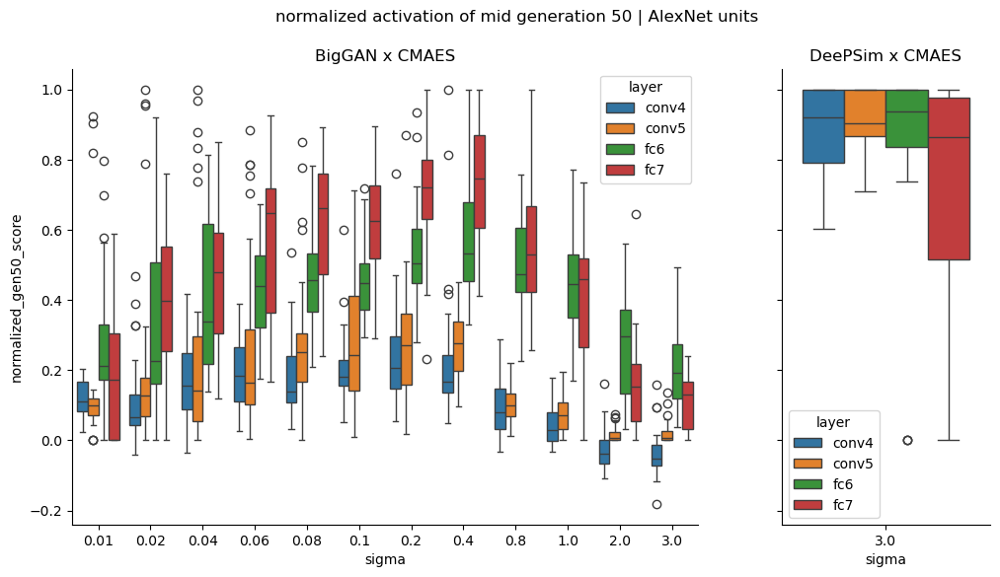

In [44]:
fig, axes = plt.subplots(1,2, figsize=(12, 6), sharey=True, gridspec_kw={'width_ratios': [3, 1]})
plt.sca(axes[0])
sns.boxplot(x='sigma', y='normalized_gen50_score', data=df.query("gan_type != 'DeePSim_fc6_INet'"), 
            hue="layer", hue_order=["conv4", "conv5", "fc6", "fc7"])
plt.title("BigGAN x CMAES")
plt.sca(axes[1])
sns.boxplot(x='sigma', y='normalized_gen50_score', data=df.query("gan_type == 'DeePSim_fc6_INet'"), 
            hue="layer", hue_order=["conv4", "conv5", "fc6", "fc7"])
plt.title("DeePSim x CMAES")
plt.suptitle("normalized activation of mid generation 50 | AlexNet units")
saveallforms(syndir, "AlexNet_BigGAN_DeePSim_Evol_hyperparam_tune_mid_score_boxplot", fig)
plt.show()

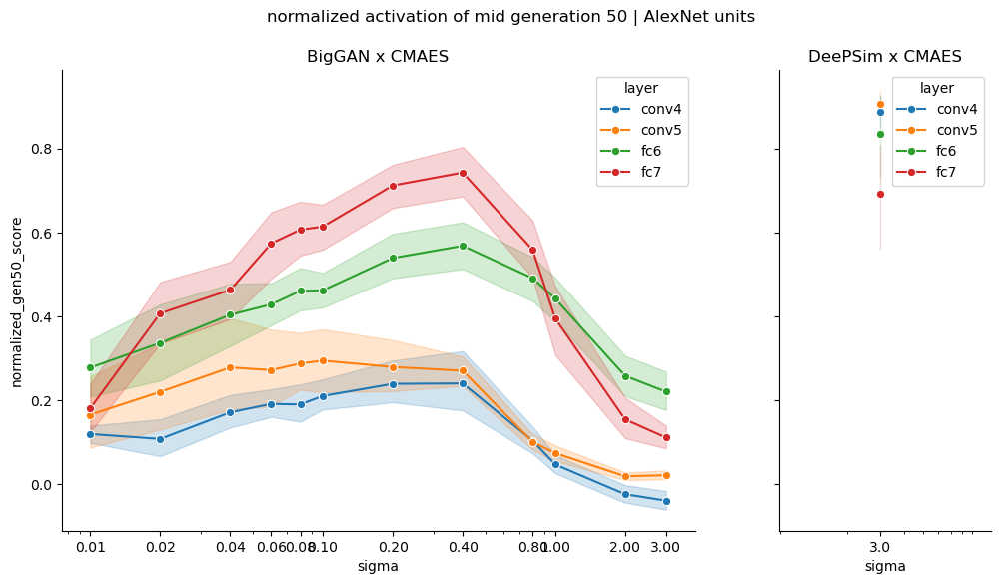

In [45]:
fig, axes = plt.subplots(1,2, figsize=(12, 6), sharey=True, gridspec_kw={'width_ratios': [3, 1]})
plt.sca(axes[0])
sns.lineplot(x='sigma', y='normalized_gen50_score', data=df.query("gan_type != 'DeePSim_fc6_INet'"), 
            hue="layer", marker="o", hue_order=["conv4", "conv5", "fc6", "fc7"])
x_ticks = df.query("gan_type != 'DeePSim_fc6_INet'").sigma.unique()
plt.xscale("log")
plt.xticks(x_ticks, [f"{x:.2f}" for x in x_ticks])
plt.title("BigGAN x CMAES")
plt.sca(axes[1])
sns.lineplot(x='sigma', y='normalized_gen50_score', data=df.query("gan_type == 'DeePSim_fc6_INet'"), 
            hue="layer", marker="o", hue_order=["conv4", "conv5", "fc6", "fc7"])
plt.xscale("log")
plt.xticks([3.0], ["3.0"])
plt.title("DeePSim x CMAES")
plt.suptitle("normalized activation of mid generation 50 | AlexNet units")
saveallforms(syndir, "AlexNet_BigGAN_DeePSim_Evol_hyperparam_tune_mid_score_lineplot", fig)
plt.show()

### Mid score normalized among BigGAN

In [38]:
# Get max score for each layer and unit
max_scores = df.query("gan_type == 'BigGAN_INet'").groupby(["layer", "channel"])["mid_gen50_mean_score"].transform("max")
# Normalize scores by dividing by max score for that layer/unit
df["BG_normalized_gen50_score"] = df["mid_gen50_mean_score"] / max_scores
# Group and aggregate the normalized scores
df.groupby(["layer", "gan_type", "sigma"]).agg({"BG_normalized_gen50_score": "mean"})

BG_normalized_gen50_score
layer gan_type         sigma                           
conv4 BigGAN_INet      0.01                    0.316993
                       0.02                    0.224835
                       0.04                    0.404487
                       0.06                    0.469947
                       0.08                    0.459619
                       0.10                    0.539675
                       0.20                    0.605932
                       0.40                    0.561515
                       0.80                    0.273542
                       1.00                    0.141688
                       2.00                   -0.064127
                       3.00                   -0.108317
      DeePSim_fc6_INet 3.00                         NaN
conv5 BigGAN_INet      0.01                    0.259661
                       0.02                    0.353772
                       0.04                    0.451736
                       0.06                    0.456575
                       0.08                    0.549156
                       0.10                    0.528619
                       0.20                    0.549014
                       0.40                    0.581849
                       0.80                    0.217589
                       1.00                    0.161229
                       2.00                    0.039104
                       3.00                    0.039857
      DeePSim_fc6_INet 3.00                         NaN
fc6   BigGAN_INet      0.01                    0.398694
                       0.02                    0.457666
                       0.04                    0.555762
                       0.06                    0.613194
                       0.08                    0.658010
                       0.10                    0.665226
                       0.20                    0.768046
                       0.40                    0.804283
                       0.80                    0.700409
                       1.00                    0.645494
                       2.00                    0.386178
                       3.00                    0.333988
      DeePSim_fc6_INet 3.00                         NaN
fc7   BigGAN_INet      0.01                    0.191300
                       0.02                    0.432052
                       0.04                    0.500260
                       0.06                    0.616805
                       0.08                    0.653171
                       0.10                    0.663501
                       0.20                    0.762809
                       0.40                    0.787585
                       0.80                    0.591196
                       1.00                    0.417116
                       2.00                    0.161925
                       3.00                    0.117366
      DeePSim_fc6_INet 3.00                         NaN

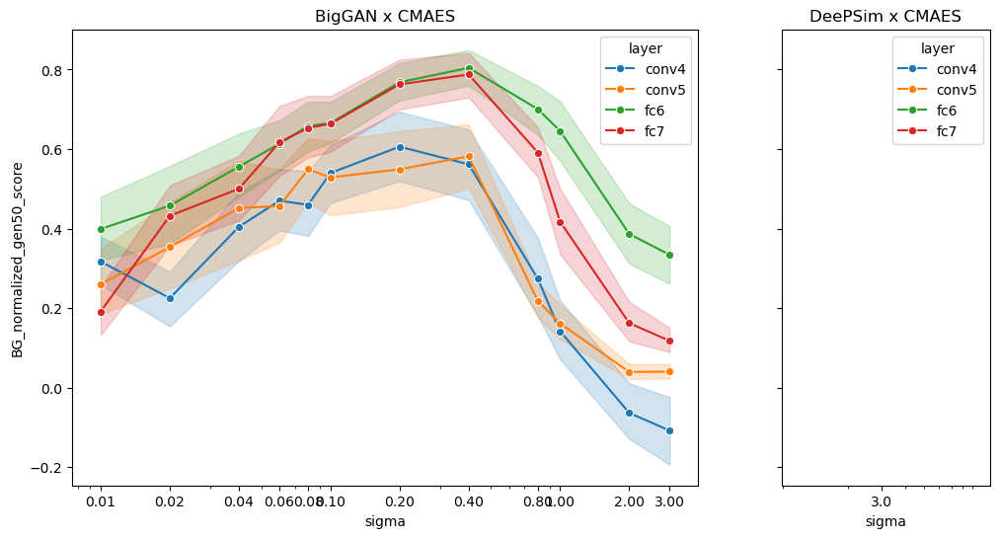

In [39]:
import seaborn as sns
import matplotlib.pyplot as plt
fig, axes = plt.subplots(1,2, figsize=(12, 6), sharey=True, gridspec_kw={'width_ratios': [3, 1]})
plt.sca(axes[0])
sns.lineplot(x='sigma', y='BG_normalized_gen50_score', data=df.query("gan_type == 'BigGAN_INet'"), 
            hue="layer", marker="o", hue_order=["conv4", "conv5", "fc6", "fc7"])
x_ticks = df.query("gan_type != 'DeePSim_fc6_INet'").sigma.unique()
plt.xscale("log")
plt.xticks(x_ticks, [f"{x:.2f}" for x in x_ticks])
plt.title("BigGAN x CMAES")
plt.sca(axes[1])
sns.lineplot(x='sigma', y='BG_normalized_gen50_score', data=df.query("not gan_type == 'BigGAN_INet'"), 
            hue="layer", marker="o", hue_order=["conv4", "conv5", "fc6", "fc7"])
plt.xscale("log")
plt.xticks([3.0], ["3.0"])
plt.title("DeePSim x CMAES")
plt.show()

### Final score analysis

In [46]:
# Get max score for each layer and unit
max_scores = df.groupby(["layer", "channel"])["last_mean_score"].transform("max")
# Normalize scores by dividing by max score for that layer/unit
df["normalized_score"] = df["last_mean_score"] / max_scores
# Group and aggregate the normalized scores
df.groupby(["layer", "gan_type", "sigma"]).agg({"normalized_score": "mean"})

normalized_score
layer gan_type         sigma                  
conv4 BigGAN_INet      0.01           0.103363
                       0.02           0.118280
                       0.04           0.173213
                       0.06           0.222540
                       0.08           0.233939
                       0.10           0.245833
                       0.20           0.301015
                       0.40           0.324183
                       0.80           0.120814
                       1.00           0.084506
                       2.00           0.009837
                       3.00          -0.005840
      DeePSim_fc6_INet 3.00           0.906110
conv5 BigGAN_INet      0.01           0.152530
                       0.02           0.201594
                       0.04           0.258987
                       0.06           0.305246
                       0.08           0.324116
                       0.10           0.355117
                       0.20           0.376280
                       0.40           0.349037
                       0.80           0.155335
                       1.00           0.107483
                       2.00           0.025231
                       3.00           0.022308
      DeePSim_fc6_INet 3.00           0.926554
fc6   BigGAN_INet      0.01           0.217722
                       0.02           0.285832
                       0.04           0.356662
                       0.06           0.397486
                       0.08           0.422223
                       0.10           0.442439
                       0.20           0.547563
                       0.40           0.547535
                       0.80           0.504548
                       1.00           0.428092
                       2.00           0.241126
                       3.00           0.227996
      DeePSim_fc6_INet 3.00           0.832113
fc7   BigGAN_INet      0.01           0.150760
                       0.02           0.337260
                       0.04           0.379459
                       0.06           0.491324
                       0.08           0.530273
                       0.10           0.561588
                       0.20           0.720893
                       0.40           0.737819
                       0.80           0.549748
                       1.00           0.408665
                       2.00           0.171071
                       3.00           0.135815
      DeePSim_fc6_INet 3.00           0.747357

In [5]:
df.groupby(["layer", "gan_type", "sigma"]).agg({"last_mean_score": "mean"})#.reset_index()

last_mean_score
layer gan_type         sigma                 
conv4 BigGAN_INet      0.01          9.883244
                       0.02         11.550123
                       0.04         17.062681
                       0.06         21.031185
                       0.08         22.045223
                       0.10         23.077875
                       0.20         28.025608
                       0.40         30.206083
                       0.80         12.035962
                       1.00          7.888402
                       2.00          1.066740
                       3.00         -0.630299
      DeePSim_fc6_INet 3.00         83.770859
conv5 BigGAN_INet      0.01         12.154521
                       0.02         16.468393
                       0.04         21.988029
                       0.06         25.801289
                       0.08         27.583626
                       0.10         30.254438
                       0.20         31.029333
                       0.40         28.873264
                       0.80         12.881842
                       1.00          8.670877
                       2.00          1.987230
                       3.00          1.667882
      DeePSim_fc6_INet 3.00         75.920555
fc6   BigGAN_INet      0.01         12.009094
                       0.02         15.275800
                       0.04         20.758450
                       0.06         22.902967
                       0.08         25.004387
                       0.10         26.142298
                       0.20         32.424812
                       0.40         32.236732
                       0.80         29.993542
                       1.00         25.715792
                       2.00         14.738993
                       3.00         14.070109
      DeePSim_fc6_INet 3.00         51.068092
fc7   BigGAN_INet      0.01          5.723714
                       0.02         13.172544
                       0.04         14.538032
                       0.06         19.279472
                       0.08         20.711905
                       0.10         21.693720
                       0.20         29.117115
                       0.40         29.846821
                       0.80         22.495884
                       1.00         16.488258
                       2.00          7.308267
                       3.00          5.650633
      DeePSim_fc6_INet 3.00         28.209612

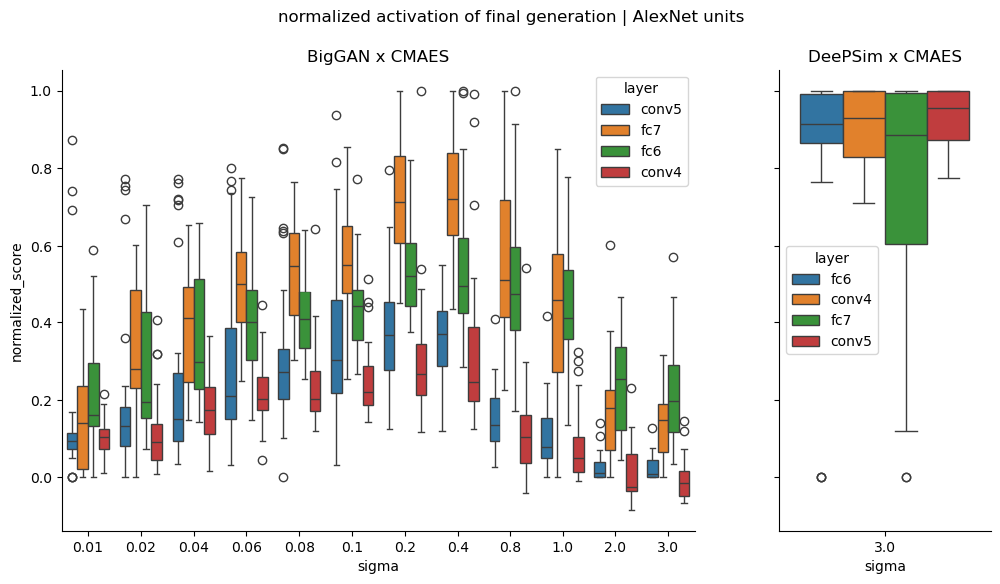

In [47]:

fig, axes = plt.subplots(1,2, figsize=(12, 6), sharey=True, gridspec_kw={'width_ratios': [3, 1]})
plt.sca(axes[0])
sns.boxplot(x='sigma', y='normalized_score', data=df.query("gan_type != 'DeePSim_fc6_INet'"), hue="layer")
plt.title("BigGAN x CMAES")
plt.sca(axes[1])
sns.boxplot(x='sigma', y='normalized_score', data=df.query("gan_type == 'DeePSim_fc6_INet'"), hue="layer")
plt.title("DeePSim x CMAES")
plt.suptitle("normalized activation of final generation | AlexNet units")
saveallforms(syndir, "AlexNet_BigGAN_DeePSim_Evol_hyperparam_tune_final_score_boxplot", fig)
plt.show()

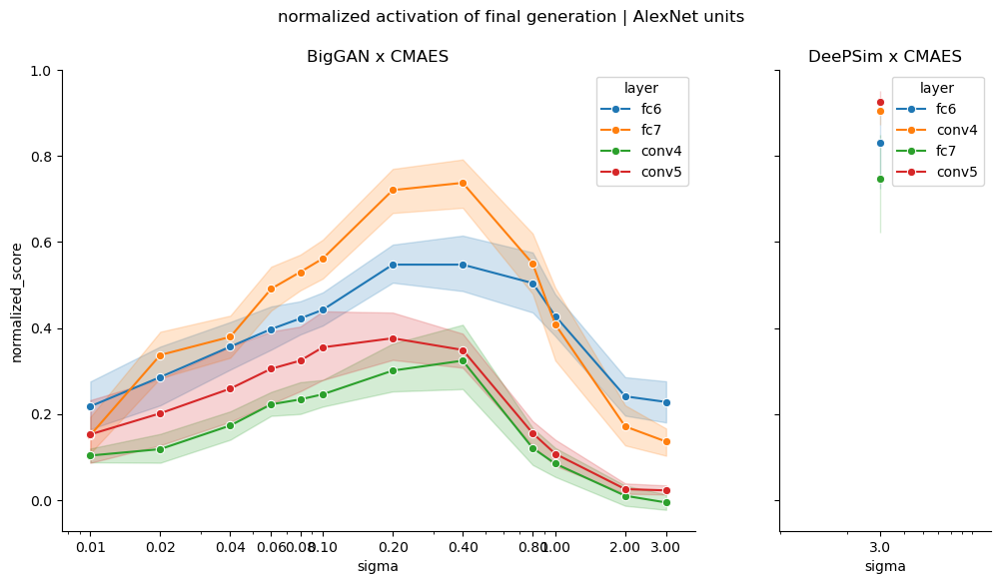

In [48]:
fig, axes = plt.subplots(1,2, figsize=(12, 6), sharey=True, gridspec_kw={'width_ratios': [3, 1]})
plt.sca(axes[0])
sns.lineplot(x='sigma', y='normalized_score', data=df.query("gan_type != 'DeePSim_fc6_INet'"), 
            hue="layer", marker="o")
x_ticks = df.query("gan_type != 'DeePSim_fc6_INet'").sigma.unique()
plt.xscale("log")
plt.xticks(x_ticks, [f"{x:.2f}" for x in x_ticks])
plt.title("BigGAN x CMAES")
plt.sca(axes[1])
sns.lineplot(x='sigma', y='normalized_score', data=df.query("gan_type == 'DeePSim_fc6_INet'"), 
            hue="layer", marker="o")
plt.xscale("log")
plt.xticks([3.0], ["3.0"])
plt.title("DeePSim x CMAES")
plt.suptitle("normalized activation of final generation | AlexNet units")
saveallforms(syndir, "AlexNet_BigGAN_DeePSim_Evol_hyperparam_tune_final_score_lineplot", fig)
plt.show()

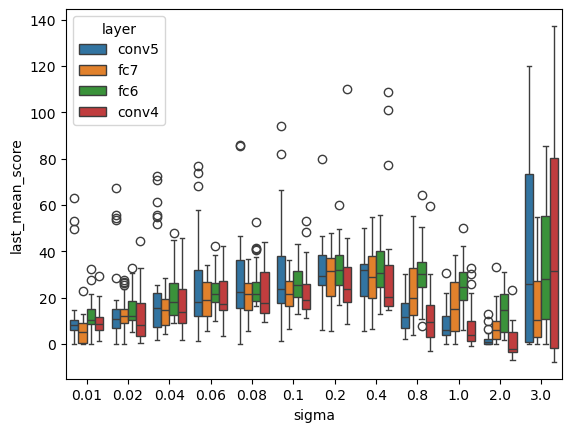

In [ ]:
sns.boxplot(x='sigma', y='last_mean_score', data=df, hue="layer")
plt.show()

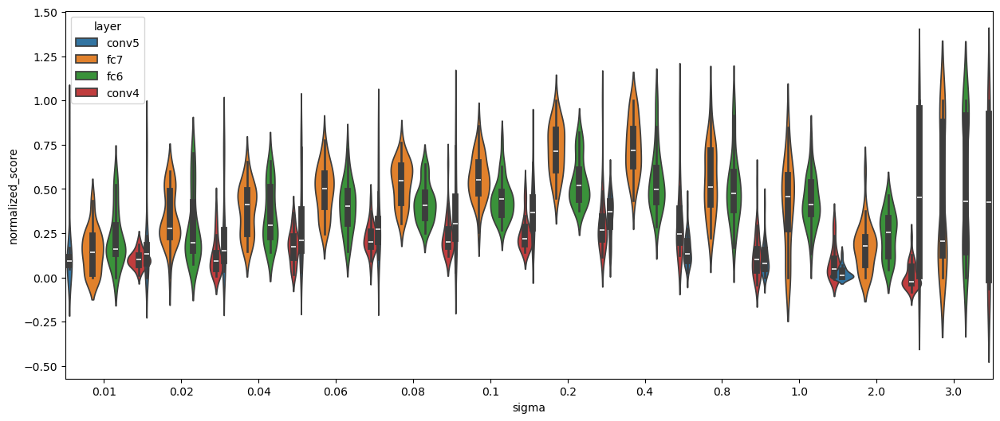

In [8]:
import seaborn as sns
import matplotlib.pyplot as plt
plt.figure(figsize=(15, 6))
sns.violinplot(x='sigma', y='normalized_score', data=df, hue="layer", width=1.2)
plt.show()

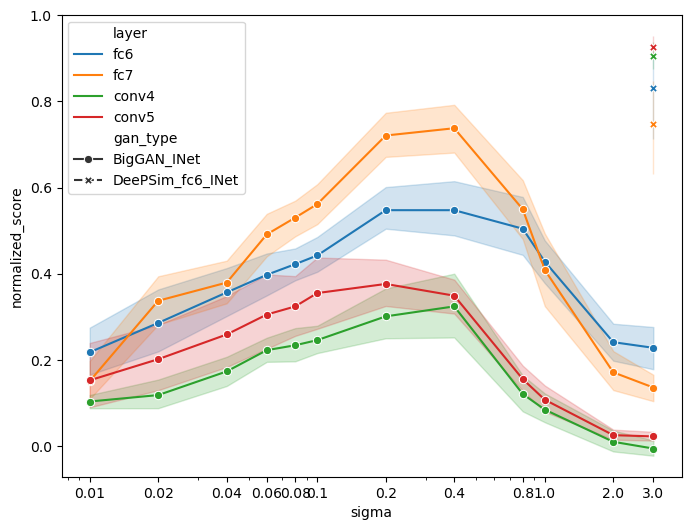

In [15]:
plt.figure(figsize=(8, 6))
sns.lineplot(x='sigma', y='normalized_score', data=df, hue="layer", markers=True, style="gan_type")
plt.xscale("log")
plt.xticks([0.01, 0.02, 0.04, 0.06, 0.08, 0.1, 0.2, 0.4, 0.8, 1.0, 2.0, 3.0], 
           ['0.01', '0.02', '0.04', '0.06', '0.08', '0.1', '0.2', '0.4', '0.8', '1.0', '2.0', '3.0'])
plt.show()

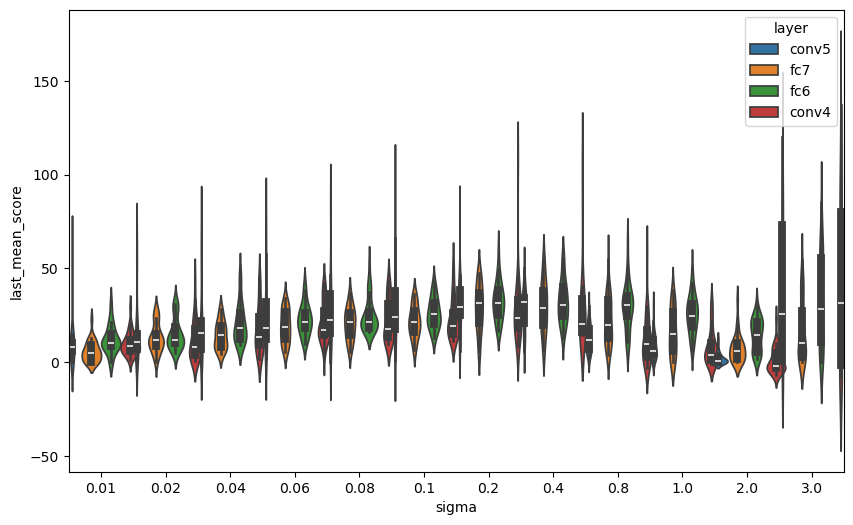

In [11]:
import seaborn as sns
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 6))
sns.violinplot(x='sigma', y='last_mean_score', data=df, hue="layer", width=1.2)
plt.show()

### Plot examples

In [61]:
import matplotlib.pyplot as plt
def plot_best_img(df_subset):
    # find best image for one layer and unit and display them
    best_imgs = df_subset.best_img.values

    fig, axes = plt.subplots(4, 4, figsize=(15, 15))
    axes = axes.ravel()
    for i, img in enumerate(best_imgs):
        if i < len(axes):
            axes[i].imshow(img.permute(1,2,0).numpy())
            axes[i].axis('off')
            axes[i].set_title(f'GAN={df_subset.iloc[i].gan_type} σ={df_subset.iloc[i].sigma:.2f} score={df_subset.iloc[i].last_mean_score:.2f}')
    for i in range(len(best_imgs), len(axes)):
        axes[i].remove()
    plt.tight_layout()
    plt.show()
    return fig

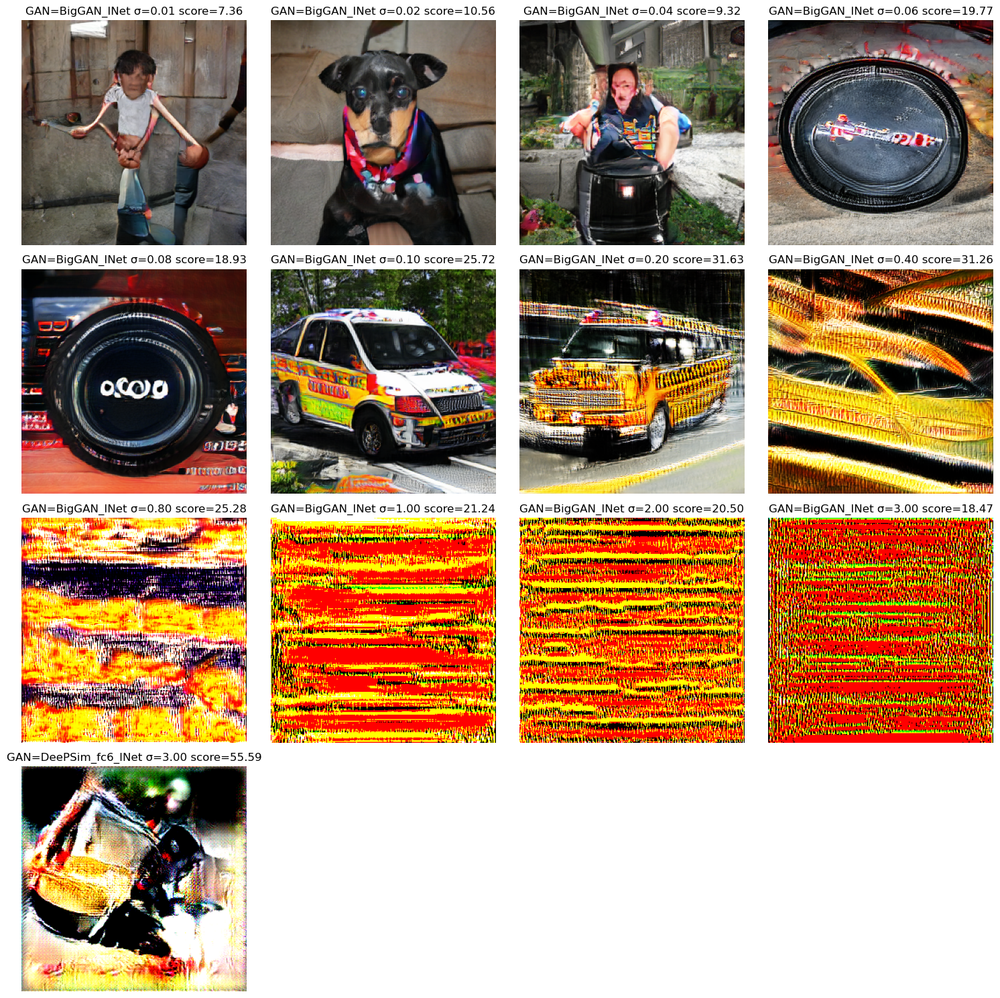

In [67]:
# find best image for one layer and unit and display them
df_subset = df.query("layer == 'fc6' and channel == 3 and rep == 1").sort_values(by=["sigma", "gan_type"], ascending=True)
figh = plot_best_img(df_subset)
saveallforms(syndir, "AlexNet_BigGAN_DeePSim_Evol_hyperparam_tune_best_img_example_fc6_3_1", figh)

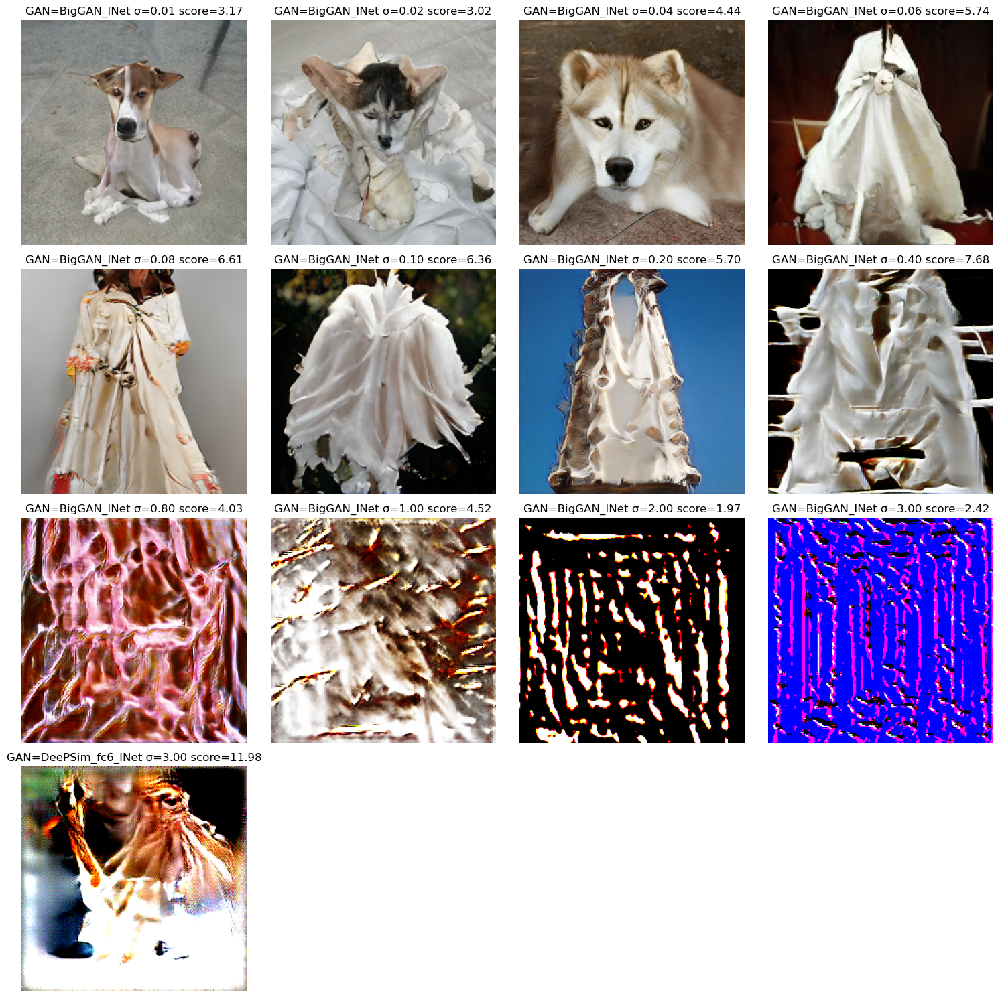

In [63]:
# find best image for one layer and unit and display them
df_subset = df.query("layer == 'fc7' and channel == 4 and rep == 2").sort_values(by="sigma", ascending=True)
figh = plot_best_img(df_subset)
saveallforms(syndir, "AlexNet_BigGAN_DeePSim_Evol_hyperparam_tune_best_img_example_fc7_4_2", figh)

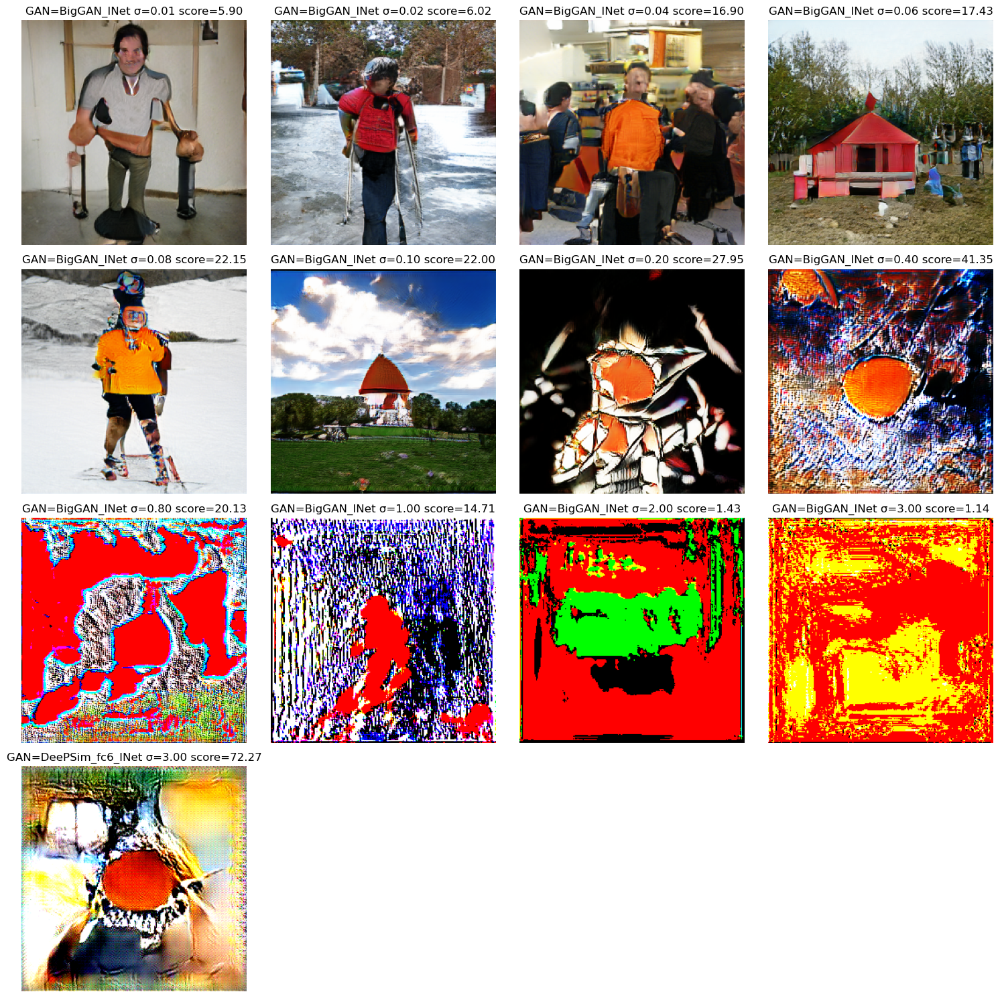

In [69]:
# find best image for one layer and unit and display them
df_subset = df.query("layer == 'conv5' and channel == 5 and rep == 1").sort_values(by=["sigma", "gan_type"], ascending=True)
figh = plot_best_img(df_subset)
saveallforms(syndir, "AlexNet_BigGAN_DeePSim_Evol_hyperparam_tune_best_img_example_conv5_5_1", figh)

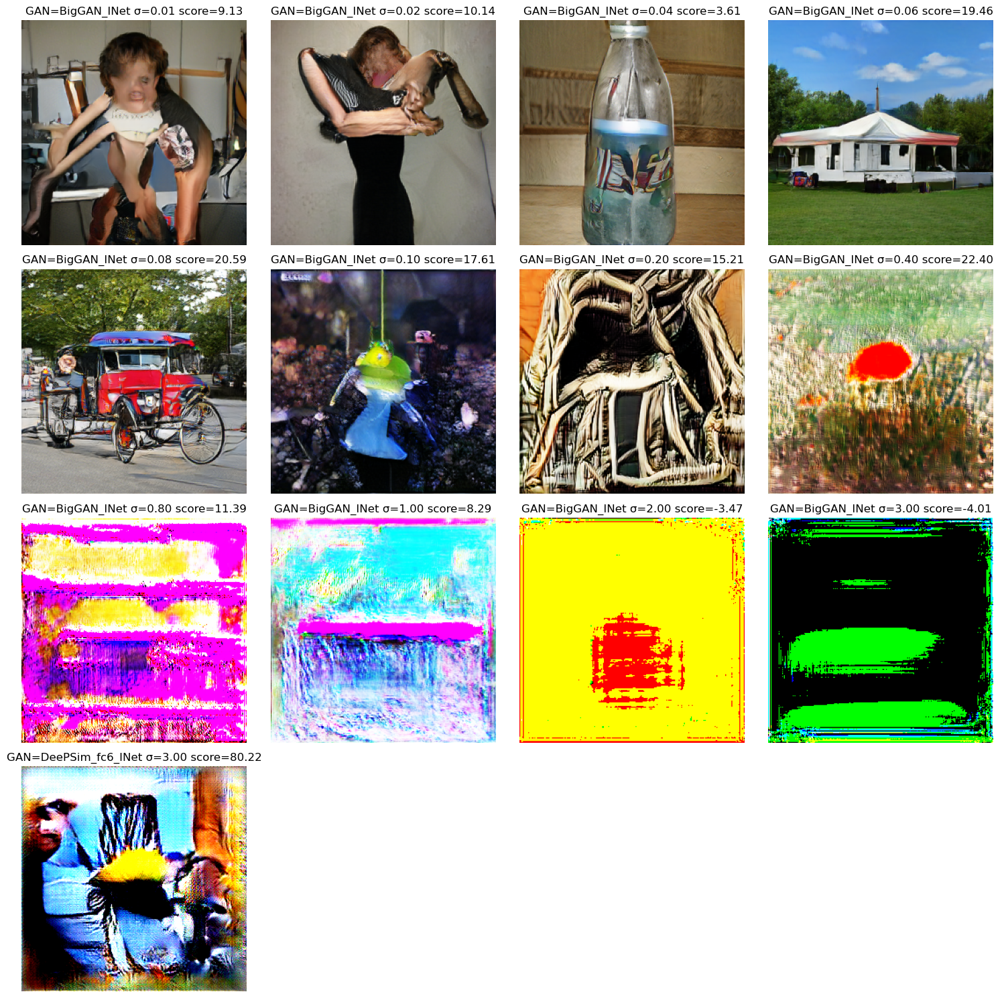

In [66]:
# find best image for one layer and unit and display them
df_subset = df.query("layer == 'conv4' and channel == 2 and rep == 1").sort_values(by=["sigma", "gan_type"], ascending=True)
figh = plot_best_img(df_subset)
saveallforms(syndir, "AlexNet_BigGAN_DeePSim_Evol_hyperparam_tune_best_img_example_conv4_2_1", figh)

In [60]:
figh

<Figure size 1500x1500 with 0 Axes>

In [ ]:
data['scores'][data['generations']==99]

array([0.48685542, 0.        , 1.3745418 , 0.47616956, 0.25406593,
       0.04545288, 1.9886062 , 1.8160329 , 0.6410893 , 1.3172786 ,
       1.1985734 , 0.57350934, 1.4319276 , 0.5996208 , 0.83228517,
       0.7598896 , 0.6953668 , 1.4959061 , 1.2191145 , 1.71506   ,
       2.154269  , 2.1595976 , 2.0553682 , 0.01042584, 2.2036872 ,
       1.4231188 , 0.28329724, 1.143847  ], dtype=float32)